## NLP Class Final Project Read Data

In [2]:
#df_analysis = pd.read_parquet('df_analysis.parquet', engine='pyarrow')
#- seperated from df_analysis into positive and negative
#df_positive = pd.read_parquet('df_positive.parquet', engine='pyarrow')
#df_negative = pd.read_parquet('df_negative.parquet', engine='pyarrow')
#lda_model_266 = topics on 37 topics of general corpus (it is 37 because i probably reduced it)
#lda_model_266 = topics on 37 topics of general corpus


In [3]:
import torch

print("CUDA is available:" , torch.cuda.is_available())
print("Number of CUDA devices:", torch.cuda.device_count())
print("CUDA version used by PyTorch:", torch.version.cuda)

for i in range(torch.cuda.device_count()):
    print(torch.cuda.get_device_name(i)) # prints the name of each available GPU

CUDA is available: True
Number of CUDA devices: 2
CUDA version used by PyTorch: 11.6
Tesla T4
Tesla T4


In [4]:
import numpy as np
import pandas as pd
# from gensim import corpora, models
# from gensim.models import Phrases
# from gensim.models import CoherenceModel
# from gensim.models.ldamodel import LdaModel
# from gensim.models.ldamulticore import LdaMulticore

#import pyLDAvis
#import pyLDAvis.gensim_models as gensimvis
from tqdm import tqdm

import re
import nltk
import os
import seaborn as sns

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 600)

In [9]:
#nltk.download('stopwords')

In [16]:
#!pip install gensim

In [22]:
#!pip install pyLDAvis

In [7]:
#!pip install nltk

In [11]:
#!pip install pyarrow    

In [12]:
%%time

df_news_final_project = pd.read_parquet('https://storage.googleapis.com/msca-bdp-data-open/news_final_project/news_final_project.parquet', engine='pyarrow')
df_news_final_project.shape

CPU times: user 7.19 s, sys: 4.07 s, total: 11.3 s
Wall time: 18 s


(200332, 5)

In [269]:
#save this dataframe so i do not have to keep reading it in
#df_news_final_project.to_parquet('news_final_project.parquet', engine='pyarrow')

In [14]:
#!pip install pandarallel

In [15]:
import pandarallel
from pandarallel import pandarallel

In [16]:
import multiprocessing

num_processors = multiprocessing.cpu_count()

# Now you can use num_processors in your code.


In [17]:
pandarallel.initialize(nb_workers=num_processors-1, use_memory_fs=False)

INFO: Pandarallel will run on 31 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [18]:
# expand length of column width
pd.set_option('display.max_colwidth', 1000)

In [270]:
#df_news_final_project.head()

In [20]:
# value counts of language
df_news_final_project['language'].value_counts()

en    200332
Name: language, dtype: int64

In [271]:
#around 60k news articles with the same titles
#around 1500 news articles with the same text - removed this 


In [272]:
#decided to only drop the same text because it may be the same articles
#im going to later analyze news articles with same titles to show importance! this will be important to see trends
df_news_final_project = df_news_final_project.drop_duplicates(subset=['text'])
df_news_final_project.shape

(198564, 8)

In [273]:
#take a sample of 1000 rows
#df_news_final_project_sample = df_news_final_project.sample(n=1000, random_state=1)

In [24]:
# reset index
df_news_final_project.reset_index(drop=True, inplace=True)


In [25]:
# Clean-up the noise, by eliminating newlines, tabs, remnants of web crawls, and other irrelevant text

import re
df_news_final_project['content_clean'] = df_news_final_project['text'].str.replace('\n', ' ') 
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('\t', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('\r', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('<!--.*?-->', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('<script.*?>.*?</script>', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('<.*?>', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('http\S+|www.\S+', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('[^a-zA-Z0-9\s]', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('\s+', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('^\s+|\s+$', ' ')



/var/tmp/ipykernel_4398/899981166.py:7: FutureWarning: The default value of regex will change from True to False in a future version.
  df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('<!--.*?-->', ' ')
/var/tmp/ipykernel_4398/899981166.py:8: FutureWarning: The default value of regex will change from True to False in a future version.
  df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('<script.*?>.*?</script>', ' ')
/var/tmp/ipykernel_4398/899981166.py:9: FutureWarning: The default value of regex will change from True to False in a future version.
  df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('<.*?>', ' ')
/var/tmp/ipykernel_4398/899981166.py:10: FutureWarning: The default value of regex will change from True to False in a future version.
  df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('http\S+|www.\S+', ' '

In [26]:
import nltk
import string
stopwords = set(nltk.corpus.stopwords.words('english'))

df_news_final_project['clean_title'] = df_news_final_project['title'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_news_final_project['clean_title'] = df_news_final_project['clean_title'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)))
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)))


In [27]:
import nltk
from nltk.corpus import stopwords

stopwords = set(stopwords.words('english'))  # define stopwords

def clean(string):
    
    url_pattern = r'(http|ftp|https):\/\/([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:\/~+#-]*[\w@?^=%&\/~+#-])'
    mention_pattern = r'[\s]*@[\w]+'
    hashtag_pattern = r'[\s]*#[\w]+'
    copyright_pattern = r"©.*"
    string_fixed = re.sub(url_pattern, "", string)
    string_fixed = re.sub(hashtag_pattern, "", string_fixed)
    string_fixed = re.sub(mention_pattern, "", string_fixed)
    string_fixed = re.sub(copyright_pattern, "", string_fixed)  # Remove everything after "©"
    string_fixed = string_fixed.replace('\n', ' ')
    
    # Convert to lower case and remove stop words without tokenization
    words = string_fixed.split()  # split string into words
    words = [word.lower() for word in words if word.lower() not in stopwords and word.isalpha()]
    
    return " ".join(words)

# Applying the function to the dataframe
df_news_final_project['cleaned_text'] = df_news_final_project['content_clean'].apply(clean)


In [28]:
df_news_final_project['clean_title'] = df_news_final_project['clean_title'].apply(clean)


In [29]:
ai_terms = ["Artificial Intelligence", "Machine Learning", "Deep Learning", "Neural Network", "Natural Language Processing", "Supervised Learning", "Unsupervised Learning", "Reinforcement Learning", "Generative Adversarial Networks", "Convolutional Neural Networks", "Recurrent Neural Networks", "Transfer Learning", "Data Mining", "Big Data", "Algorithm","large language models","llms","robotics","Chatbot", "Robotic Process Automation", "Computer Vision", "Image Recognition", "Speech Recognition", "Text Analytics", "Sentiment Analysis", "Autonomous Vehicles", "Internet of Things", "Edge Computing", "Quantum Computing"]


In [30]:
#filter dataframe 
ai_terms = '|'.join(ai_terms)


In [31]:
ai_terms

'Artificial Intelligence|Machine Learning|Deep Learning|Neural Network|Natural Language Processing|Supervised Learning|Unsupervised Learning|Reinforcement Learning|Generative Adversarial Networks|Convolutional Neural Networks|Recurrent Neural Networks|Transfer Learning|Data Mining|Big Data|Algorithm|large language models|llms|robotics|Chatbot|Robotic Process Automation|Computer Vision|Image Recognition|Speech Recognition|Text Analytics|Sentiment Analysis|Autonomous Vehicles|Internet of Things|Edge Computing|Quantum Computing'

In [32]:
df_filtered = df_news_final_project[df_news_final_project['cleaned_text'].str.contains(ai_terms, case=False, na=False)]


In [33]:
df_filtered.shape

(164097, 8)

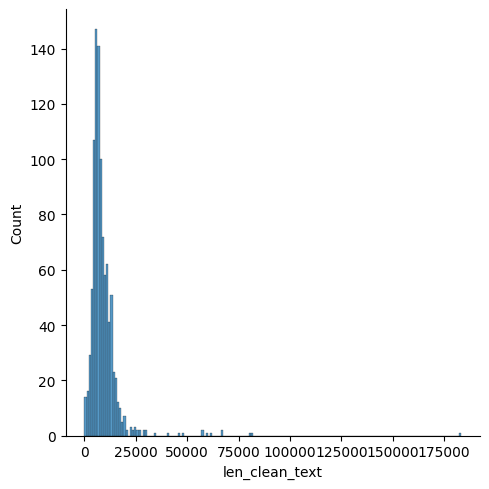

In [76]:
# #before cleaning - DONT RUN THIS
# import seaborn as sns
# df_news_final_project_sample = df_news_final_project_sample.dropna()
# df_news_final_project_sample = df_news_final_project_sample.drop_duplicates(subset=['cleaned_text'])
# df_news_final_project_sample['len_clean_text'] = df_news_final_project_sample['cleaned_text'].apply(lambda x: len(x))
# sns.displot(data=df_news_final_project_sample,x='len_clean_text')


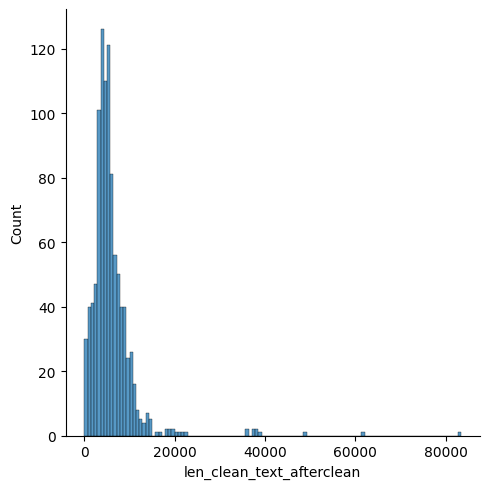

In [80]:
#after cleaning
import seaborn as sns
df_news_final_project_sample = df_news_final_project_sample.dropna()
df_news_final_project_sample = df_news_final_project_sample.drop_duplicates(subset=['cleaned_text'])
df_news_final_project_sample['len_clean_text_afterclean'] = df_news_final_project_sample['cleaned_text'].apply(lambda x: len(x))
sns.displot(data=df_news_final_project_sample,x='len_clean_text_afterclean')


In [32]:
news_df = df_news_final_project

In [33]:
news_df.shape

(198564, 8)

In [34]:
tokenizer = nltk.tokenize.TweetTokenizer()

# This creates a list of all tokenized sentences
tokenized_sentences = news_df['cleaned_text'].apply(tokenizer.tokenize).tolist()

# This will flatten the list of lists into a single list
words = [word for sublist in tokenized_sentences for word in sublist]


In [35]:
bgs = nltk.bigrams(words)
targeted_bgs = ['machine','learning','ai','artificial','intelligence','natural','language','processing','chatgpt','data','science','python','r','c','analytics','ml','nlp','generative','legal','office','law','llm','large','language','model','management','business','finance','financial','industry','healthcare','production','service','manufacture','productivity','job','GenAI']
bgs = [b for b in bgs if (b[0] in targeted_bgs) or (b[1] in targeted_bgs)]
bigrams_freq = nltk.FreqDist(bgs)
bigrams_freq_df = pd.DataFrame(bigrams_freq.most_common(),columns=['Word', 'Frequency'])
bigrams_freq_df.head(n=50)


,Word,Frequency
0,"(artificial, intelligence)",621509
1,"(machine, learning)",239444
2,"(intelligence, ai)",126521
3,"(data, science)",76450
4,"(global, artificial)",65781
5,"(generative, ai)",44736
6,"(financial, services)",43689
7,"(ai, powered)",41162
8,"(ai, technology)",39027
9,"(ai, market)",35826


In [141]:
# assuming 'words' is a list of tokenized words from your document
fourgrams = nltk.ngrams(words, 4)

targeted_fourgrams = [
    'machine', 'learning', 'ai', 'artificial', 'intelligence', 'natural', 
    'language', 'processing', 'chatgpt', 'data', 'science', 'python', 'r', 
    'c', 'analytics', 'ml', 'nlp', 'generative', 'legal', 'office', 'law', 
    'llm', 'large', 'language', 'model', 'management', 'business', 'finance', 
    'financial', 'industry', 'healthcare', 'production', 'service', 
    'manufacture', 'productivity', 'job', 'GenAI'
]

fourgrams = [
    b for b in fourgrams 
    if (b[0] in targeted_fourgrams) or (b[1] in targeted_fourgrams) 
    or (b[2] in targeted_fourgrams) or (b[3] in targeted_fourgrams)
]

fourgrams_dist = nltk.FreqDist(fourgrams)
fourgrams_dist_df = pd.DataFrame(fourgrams_dist.most_common(), columns=['Word', 'Frequency'])
fourgrams_dist_df.head(n=50)


,Word,Frequency
0,"(global, artificial, intelligence, ai)",102
1,"(artificial, intelligence, ai, service)",86
2,"(call, center, ai, market)",73
3,"(artificial, intelligence, energy, market)",71
4,"(intelligence, energy, market, market)",62
5,"(artificial, intelligencebased, security, market)",56
6,"(ai, computer, vision, market)",53
7,"(artificial, intelligence, software, market)",53
8,"(cyber, data, science, market)",52
9,"(automotive, artificial, intelligence, software)",47


# Sentiment Analysis

#### Running FinancialBert for sentiment analysis - not great results so tried more sentiment analysis models from hugging face

In [36]:
#!pip install -q transformers

In [39]:
# created on GCP Vertex AI Notebook using  `Python 3 (CUDA Toolkit 11.0)` environment
# using n1-standard-4 (4 vCPUS, 15 GB RAM) compute w/ 1 NVIDIA T4 GPU

# dependencies
#!pip install torch==1.13.1+cu116 torchvision==0.14.1+cu116 torchaudio==0.13.1 --extra-index-url https://download.pytorch.org/whl/cu116
#!pip install transformers datasets evaluate rouge-score nltk py7zr
#nltk.download("punkt")

# note: installing an older version of pytorch so that cuda versions match
# note: py7zr is needed for the `samsum` dataset, may or may not be needed for other datasets

In [140]:
#!pip install tensorflow

In [40]:
from __future__ import absolute_import, division, print_function

import collections

import math
import glob
import json

import numpy as np
import torch
from torch.utils.data import DataLoader, SequentialSampler, TensorDataset

from transformers import WEIGHTS_NAME, BertConfig, BertForQuestionAnswering, BertTokenizer
from transformers import AutoTokenizer, AutoModelForQuestionAnswering

from transformers import logging
import tensorflow as tf

logging.set_verbosity_error()
logging.get_verbosity()

# from utils import (get_answer, input_to_squad_example,
#                    squad_examples_to_features, to_list)

2023-05-19 04:15:32.272868: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


40

In [42]:
df_filtered_sample = df_filtered.sample(n=1000, random_state=1)

In [43]:
df_filtered_sample.shape

(1000, 8)

In [ ]:
from transformers import BertTokenizer, BertForSequenceClassification
import torch

# Load pretrained model and tokenizer
model = BertForSequenceClassification.from_pretrained("ahmedrachid/FinancialBERT-Sentiment-Analysis", num_labels=3)
tokenizer = BertTokenizer.from_pretrained("ahmedrachid/FinancialBERT-Sentiment-Analysis")

# Define the maximum length for the text chunks. BERT typically works with a max_length of 512.
max_length = 512

# Function to apply sentiment analysis and manage text length
def get_sentiment_and_score(text):
    # Tokenize the text
    inputs = tokenizer(text, truncation=True, padding='longest', max_length=max_length, return_tensors='pt')
    
    # Get the model's output
    output = model(**inputs)

    # Get the sentiment
    sentiment = output.logits.argmax(dim=1).item()

    # Convert logits to probabilities
    probabilities = torch.nn.functional.softmax(output.logits, dim=-1)

    # Get the confidence score
    confidence_score = probabilities.max(dim=-1).values.item()

    # Convert the sentiment label from integer to string
    if sentiment == 0:
        sentiment = 'negative'
    elif sentiment == 1:
        sentiment = 'neutral'
    else:
        sentiment = 'positive'

    return sentiment, confidence_score

# Apply the function to the 'cleaned_text' column
df_filtered_sample['sentiment_finbert_title'], df_filtered_sample['confidence_score'] = zip(*df_filtered_sample['cleaned_text'].map(get_sentiment_and_score))


In [12]:
#value counts for sentiment column
df_filtered_sample['sentiment'].value_counts()

sentiment
neutral     741
positive    259
Name: count, dtype: int64

### Trying sentiment using siebert/sentiment-roberta-large-english - not good results

In [52]:
import torch
from transformers import pipeline

# Check if a GPU is available and if not, use a CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [44]:
from transformers import pipeline
sentiment_analysis = pipeline("sentiment-analysis",model="siebert/sentiment-roberta-large-english")
print(sentiment_analysis("I love this!"))



[{'label': 'POSITIVE', 'score': 0.9988656044006348}]


In [55]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="siebert/sentiment-roberta-large-english")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['cleaned_text'][i:i + batch_size] for i in range(0,df_filtered_sample['cleaned_text'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [1 if result['label'] == 'positive' else 0 for result in results]
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['sentiment'] = sentiments


CPU times: user 2h 42min 58s, sys: 2.37 s, total: 2h 43min
Wall time: 10min 21s


In [57]:
df_filtered_sample['sentiment'].value_counts()

0    1000
Name: sentiment, dtype: int64

#### roberta-base-sentiment - better results

In [67]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['cleaned_text'][i:i + batch_size] for i in range(0,df_filtered_sample['cleaned_text'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['sentiment_roberta_base'] = sentiments


CPU times: user 51min 41s, sys: 875 ms, total: 51min 42s
Wall time: 3min 15s


In [68]:
df_filtered_sample['sentiment_roberta_base'].value_counts()
#800 neutral for title

LABEL_1    987
LABEL_0      7
LABEL_2      6
Name: sentiment_roberta_base, dtype: int64

In [69]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="shashanksrinath/News_Sentiment_Analysis")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['clean_title'][i:i + batch_size] for i in range(0,df_filtered_sample['clean_title'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['sentiment_srikanth_title'] = sentiments


CPU times: user 5min 29s, sys: 1.04 s, total: 5min 30s
Wall time: 30.6 s


In [70]:
df_filtered_sample['sentiment_srikanth_title'].value_counts()
#1000 neutral for text

Neutral     923
Positive     40
Negative     37
Name: sentiment_srikanth_title, dtype: int64

#### tried another model called news_sentiment_analysis - not good results 

In [71]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="shashanksrinath/News_Sentiment_Analysis")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['cleaned_text'][i:i + batch_size] for i in range(0,df_filtered_sample['cleaned_text'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['sentiment_srikanth'] = sentiments


CPU times: user 51min, sys: 1.08 s, total: 51min 1s
Wall time: 3min 13s


In [72]:
df_filtered_sample['sentiment_srikanth'].value_counts()
#923 neurtral for title

Neutral    1000
Name: sentiment_srikanth, dtype: int64

In [78]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment-latest",tokenizer = "cardiffnlp/twitter-roberta-base-sentiment-latest")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['cleaned_text'][i:i + batch_size] for i in range(0,df_filtered_sample['cleaned_text'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['roberta_latest'] = sentiments


CPU times: user 50min 39s, sys: 1.76 s, total: 50min 41s
Wall time: 3min 18s


In [79]:
df_filtered_sample['roberta_latest'].value_counts()


neutral     986
positive     10
negative      4
Name: roberta_latest, dtype: int64

In [81]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment-latest",tokenizer = "cardiffnlp/twitter-roberta-base-sentiment-latest")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['clean_title'][i:i + batch_size] for i in range(0,df_filtered_sample['clean_title'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['roberta_latest_title'] = sentiments


CPU times: user 5min 4s, sys: 328 ms, total: 5min 4s
Wall time: 20.1 s


In [82]:
df_filtered_sample['roberta_latest_title'].value_counts()


neutral     826
positive    104
negative     70
Name: roberta_latest_title, dtype: int64

In [125]:
thresholds = {
    'LABEL_0': 0.05,  # Negative threshold
    'LABEL_1': 0.9,  # Neutral threshold
    'LABEL_2': 0.05,  # Positive threshold
}


In [126]:
def get_sentiment(text):
    # Preprocess and encode the text
    encoded_input = tokenizer(text, truncation=True, max_length=512, return_tensors='pt')

    # Get the model's output
    output = model(**encoded_input)
    scores = output.logits.detach().numpy()

    # Convert logits to probabilities
    probabilities = softmax(scores, axis=-1)[0]

    # Create a dictionary mapping labels to their probabilities
    label_probs = {f'LABEL_{i}': prob for i, prob in enumerate(probabilities)}
    
    # Assign the label with the highest probability that exceeds its threshold
    sentiment_label = 'unclassified'  # Default label if no thresholds are exceeded
    for label, prob in label_probs.items():
        if prob > thresholds[label]:  # Check if the probability exceeds the threshold
            sentiment_label = label
            break  # Stop checking other labels

    return sentiment_label


In [145]:
%%time

# Apply the function to the 'cleaned_title' column
df_filtered_sample['roberta_latest_title'] = df_filtered_sample['clean_title'].apply(get_sentiment)


CPU times: user 5min 41s, sys: 200 ms, total: 5min 41s
Wall time: 21.4 s


In [146]:
df_filtered_sample['roberta_latest_title'].value_counts()


LABEL_2    605
LABEL_0    290
LABEL_1    105
Name: roberta_latest_title, dtype: int64

In [135]:
df_filtered_sample[df_filtered_sample['roberta_latest_title'] == 'LABEL_0'].head()


,url,date,language,title,text,content_clean,clean_title,cleaned_text,sentiment,sentiment_roberta_base_title,sentiment_roberta_base,sentiment_srikanth_title,sentiment_srikanth,roberta_latest,roberta_latest_title
145061,https://www.inputmag.com/culture/south-korea-is-installing-thousands-of-ai-security-cameras-in-seoul,2020-01-03,en,South Korea is installing thousands of AI security cameras in Seoul,"South Korea is installing thousands of AI security cameras in Seoul Matthew Willejust nowCultureSouth Korea is installing thousands of AI security cameras in SeoulHave the creators heard of AI bias?ShutterstockSouth Korea just announced that it intends to install 3,000 AI-powered cameras around the country’s capital, Seoul. As if being constantly recorded by security cameras wasn’t dystopian enough, now some of those cameras will be able to think for themselves, too.This could be very dangerous — The problem with using AI to detect crimes is that it’s only as accurate as its programmers allow it to be. Many times this is AI’s downfall: its inherent biases. Maybe there’s a slight pattern of crimes being committed by people wearing black hats — does that mean everyone wearing a black hat will be flagged as a potential criminal? Or, more to the point, what if the AI’s programming favors a particular race or gender?AI-in-progress — Right now the AI that’s set to power ...",South Korea installing thousands AI security cameras Seoul Matthew Willejust nowCultureSouth Korea installing thousands AI security cameras SeoulHave creators heard AI bias ShutterstockSouth Korea announced intends install 3 000 AI powered cameras around country capital Seoul As constantly recorded security cameras dystopian enough cameras able think This could dangerous The problem using AI detect crimes accurate programmers allow Many times AI downfall inherent biases Maybe slight pattern crimes committed people wearing black hats mean everyone wearing black hat flagged potential criminal Or point AI programming favors particular race gender AI progress Right AI set power cameras still studying something like 20 000 court documents pieces crime footage The goal AI cameras able deduce likelihood crime take place given place time The cameras reportedly able compare past crime patterns real time footage A finished version AI software expected finished 2022 Complex discerning algorit...,south korea installing thousands ai security cameras seoul,south korea installing thousands ai security cameras seoul matthew willejust nowculturesouth korea installing thousands ai security cameras seoulhave creators heard ai bias shutterstocksouth korea announced intends install ai powered cameras around country capital seoul constantly recorded security cameras dystopian enough cameras able think could dangerous problem using ai detect crimes accurate programmers allow many times ai downfall inherent biases maybe slight pattern crimes committed people wearing black hats mean everyone wearing black hat flagged potential criminal point ai programming favors particular race gender ai progress right ai set power cameras still studying something like court documents pieces crime footage goal ai cameras able deduce likelihood crime take place given place time cameras reportedly able compare past crime patterns real time footage finished version ai software expected finished complex discerning algorithms according electronics telecommunication...,0,LABEL_1,LABEL_1,Neutral,Neutral,neutral,LABEL_0
75570,https://telecom.economictimes.indiatimes.com/news/google-wants-ai-in-one-thousand-languages/95269908,2022-11-03,en,"Google: Google wants AI in one thousand languages, Telecom News, ET Telecom","\n\n\n Google: Google wants AI in one thousand languages, Telecom News, ET Telecom\n \n\n\n \n\n \n\n \n\nAccept the updated privacy & cookie policy\nDear user, ET Telecom privacy and cookie policy has been updated to align with the new data regulations in European Union. Please review and accept these c

In [136]:
df_filtered_sample[df_filtered_sample['roberta_latest_title'] == 'LABEL_2'].head()


,url,date,language,title,text,content_clean,clean_title,cleaned_text,sentiment,sentiment_roberta_base_title,sentiment_roberta_base,sentiment_srikanth_title,sentiment_srikanth,roberta_latest,roberta_latest_title
96162,https://economictimes.indiatimes.com/tech/technology/bytedance-team-to-develop-ai-chips-as-china-aims-for-self-reliance/articleshow/81527484.cms,2021-03-16,en,ByteDance team to develop AI chips as China aims for self-reliance - The Economic Times,"ByteDance team to develop AI chips as China aims for self-reliance - The Economic Times Benchmarks Nifty14,910.45-19.05NSE Gainer-Large Cap General Ins Corp225.7516.5FEATURED FUNDS★★★★★ICICI Prudential Credit Risk Fund Direct Plan-Gr..5Y Return9.3 %\n Invest NowFEATURED FUNDS★★★★★ICICI Prudential Asset Allocator Fund (FOF) Dire..5Y Return14.15 %\n Invest NowFEATURED FUNDS★★★★★ICICI Prudential Balanced Advantage Direct-Growt..5Y Return13.5 %\n Invest NowFEATURED FUNDS★★★★★ICICI Prudential Smallcap Fund Direct Plan-Growt..5Y Return16.29 %\n Invest NowFEATURED FUNDS★★★★★ICICI Prudential Large & Mid Cap Fund Direct Pla..5Y Return15.19 %\n Invest NowMarket WatchEnglish EditionEnglish Editionहिंदी संस्करण | E-PaperSubscribeSign InSearch+HomeETPrimeMarketsNewsIndustryRISEPoliticsWealthMFTechJobsOpinionNRIPanacheET NOWMoreMediawireNewslettersAlertsE-PaperE-LearningET Alexa SkillsET intelligenceMobileET Android App...",ByteDance team develop AI chips China aims self reliance The Economic Times Benchmarks Nifty14 910 45 19 05NSE Gainer Large Cap General Ins Corp225 7516 5FEATURED FUNDS ICICI Prudential Credit Risk Fund Direct Plan Gr 5Y Return9 3 Invest NowFEATURED FUNDS ICICI Prudential Asset Allocator Fund FOF Dire 5Y Return14 15 Invest NowFEATURED FUNDS ICICI Prudential Balanced Advantage Direct Growt 5Y Return13 5 Invest NowFEATURED FUNDS ICICI Prudential Smallcap Fund Direct Plan Growt 5Y Return16 29 Invest NowFEATURED FUNDS ICICI Prudential Large Mid Cap Fund Direct Pla 5Y Return15 19 Invest NowMarket WatchEnglish EditionEnglish Edition E PaperSubscribeSign InSearch HomeETPrimeMarketsNewsIndustryRISEPoliticsWealthMFTechJobsOpinionNRIPanacheET NOWMoreMediawireNewslettersAlertsE PaperE LearningET Alexa SkillsET intelligenceMobileET Android AppET iPhone AppET iPad AppET Wealth iPadET Blackberry AppET Nokia AppET Markets Android AppET Markets iPhone AppBrand SolutionsET India Inc BoardroomET Mar...,bytedance team develop ai chips china aims selfreliance economic times,bytedance team develop ai chips china aims self reliance economic times benchmarks gainer large cap general ins funds icici prudential credit risk fund direct plan gr invest nowfeatured funds icici prudential asset allocator fund fof dire invest nowfeatured funds icici prudential balanced advantage direct growt invest nowfeatured funds icici prudential smallcap fund direct plan growt invest nowfeatured funds icici prudential large mid cap fund direct pla invest nowmarket watchenglish editionenglish edition e papersubscribesign insearch homeetprimemarketsnewsindustryrisepoliticswealthmftechjobsopinionnripanacheet nowmoremediawirenewslettersalertse papere learninget alexa skillset intelligencemobileet android appet iphone appet ipad appet wealth ipadet blackberry appet nokia appet markets android appet markets iphone appbrand solutionset india inc boardroomet markets conclave cryptocurrencyet ceo roundtablethe night ideas hours live feel closer economic times digital payments forum e...,0,LABEL_1,LABEL_1,Neutral,Neutral,neutral,LABEL_2
121496,https://www.wilx.com/prnewswire/2023/04/03/2023-new-york-international-auto-show-guests-use-artificial-intelligence-create-their-picture-perfect-lexus/,2023-04-03,en,2023 New York International Auto Show Guests Use Artificial Intelligence to Create their Picture-Perfect Lexus,"2023 New York International Auto Show Guests Use Artificial Intelligence to Create their Picture-Perfect Lexus\n\nSkip to contentNewsFirst Alert WeatherLivestreamClosingsSportsSubmit Photos and VideosWatch

#### Decided to use cardiffnlp/twitter-roberta-base-sentiment-latest on title because it is able to seperate positive and negative the best - defined thresholds for negative positive and neutral to create the best seperation.

# Roberta Base Sentiment Latest on Title

In [307]:
df_analysis.shape
#147680 only contains positive and negative sentiment on articles

(147680, 5)

In [149]:
columns_to_drop = ['language', 'title', 'text', 'content_clean']
df_analysis = df_filtered.drop(columns=columns_to_drop)


In [152]:
%%time
df_analysis['roberta_latest_title_sentiment'] = df_analysis['clean_title'].apply(get_sentiment)


CPU times: user 15h 42min 12s, sys: 33.8 s, total: 15h 42min 46s
Wall time: 58min 55s


In [167]:
df_analysis['roberta_latest_title_sentiment'].value_counts()
#0 is negative 
#2 is positive
#1 is neutral

LABEL_2    100996
LABEL_0     46684
LABEL_1     16417
Name: roberta_latest_title_sentiment, dtype: int64

In [150]:
df_analysis.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 164097 entries, 0 to 198562
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   url           164097 non-null  object
 1   date          164097 non-null  object
 2   clean_title   164097 non-null  object
 3   cleaned_text  164097 non-null  object
dtypes: object(4)
memory usage: 6.3+ MB


In [151]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 164097 entries, 0 to 198562
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   url            164097 non-null  object
 1   date           164097 non-null  object
 2   language       164097 non-null  object
 3   title          164097 non-null  object
 4   text           164097 non-null  object
 5   content_clean  164097 non-null  object
 6   clean_title    164097 non-null  object
 7   cleaned_text   164097 non-null  object
dtypes: object(8)
memory usage: 11.3+ MB


# BERT Topic modeling (on entire corpus)

In [203]:
# bert topic on the sample above
#!pip install bertopic

In [8]:
from bertopic import BERTopic

pd.set_option('display.max_colwidth', 500)

2023-05-23 03:01:41.400883: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-23 03:01:57.425048: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-23 03:01:57.428785: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-

In [ ]:
docs = df_analysis['cleaned_text'].tolist()


In [ ]:
%%time

topic_model = BERTopic(language="english", min_topic_size=100, n_gram_range=(1,2), calculate_probabilities=False, verbose=True)
topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/5129 [00:00<?, ?it/s]

2023-05-19 08:32:27,334 - BERTopic - Transformed documents to Embeddings
2023-05-19 08:34:44,446 - BERTopic - Reduced dimensionality
2023-05-19 08:35:01,346 - BERTopic - Clustered reduced embeddings


CPU times: user 1h 11min 18s, sys: 13min 18s, total: 1h 24min 37s
Wall time: 30min 57s


In [82]:
#this is calculate probabilities = True - only if you have less documents
# %%time

# # topic_model = BERTopic(language="english", min_topic_size=100, n_gram_range=(1,2), calculate_probabilities=True, verbose=True)
# topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/32 [00:00<?, ?it/s]

2023-05-18 20:46:57,224 - BERTopic - Transformed documents to Embeddings
2023-05-18 20:47:04,316 - BERTopic - Reduced dimensionality
2023-05-18 20:47:04,526 - BERTopic - Clustered reduced embeddings


CPU times: total: 9min 18s
Wall time: 2min 52s


In [177]:
freq = topic_model.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(20)
#266 topics found

Topics found: 266


,Topic,Count,Name
0,-1,68052,-1_ai_news_data_new
1,0,7351,0_gray_gray media_media group_fund
2,1,2940,1_market_analysis_global_growth
3,2,2689,2_ment_cision_products_overview
4,3,2272,3_chatgpt_openai_gpt_chatbot
5,4,2236,4_market_artificial intelligence_artificial_intelligence
6,5,2165,5_us_newswires_presswire_ein
7,6,1729,6_npr_radio_schedule_donate
8,7,1627,7_days_day_hours_may also
9,8,1367,8_venturebeat_follow_follow us_vb


In [ ]:
topic_model.get_topic(0)  # Select the most frequent topic

[('gray', 0.007091426161136105),
 ('gray media', 0.0058789357950799976),
 ('media group', 0.005795778242709462),
 ('fund', 0.00578512053063246),
 ('prnewswire', 0.005234564722450711),
 ('group', 0.00502938227527594),
 ('ai', 0.004619169760825638),
 ('inc', 0.004490669368212461),
 ('group inc', 0.004454445690367658),
 ('press release', 0.0043550681738023555)]

In [ ]:
topic_model.get_topic(1)  # Select the most frequent topic

[('market', 0.018099644171155383),
 ('analysis', 0.010799928169534559),
 ('global', 0.009880534226911732),
 ('growth', 0.009762054240905335),
 ('report', 0.009636360758209145),
 ('players', 0.008618198408822181),
 ('forecast', 0.008037437129280343),
 ('key', 0.007947895814556622),
 ('trends', 0.006917526317881663),
 ('artificial intelligence', 0.0067421328819746934)]

In [179]:
topic_model.get_topic(4) 

[('market', 0.020022401328726697),
 ('artificial intelligence', 0.014153443989317399),
 ('artificial', 0.014029064550587212),
 ('intelligence', 0.013742644967803043),
 ('report', 0.011640485276490361),
 ('analysis', 0.011443175454969482),
 ('growth', 0.010096051278654598),
 ('global', 0.009964343512412066),
 ('global artificial', 0.009088895392028373),
 ('forecast', 0.008530568818852252)]

In [ ]:
#cant visualize topic probability distribution because probabilities not calculated for too many documents
# %%time
# # 
# topic_model.visualize_distribution(probs[100], min_probability=0.001)

#### Visualize Topic Hierarchy

#### The topics that were created can be hierarchically reduced. In order to understand the potential hierarchical structure of the topics, we can use scipy.cluster.hierarchy to create clusters and visualize how they relate to one another. This might help selecting an appropriate nr_topics when reducing the number of topics that you have created.

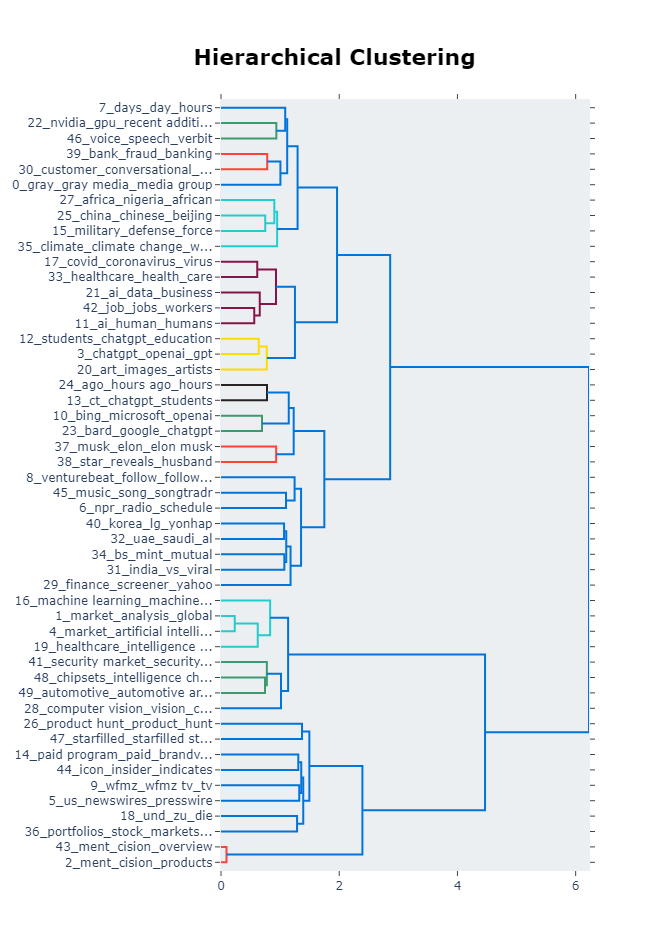

In [ ]:
topic_model.visualize_hierarchy(top_n_topics=50)


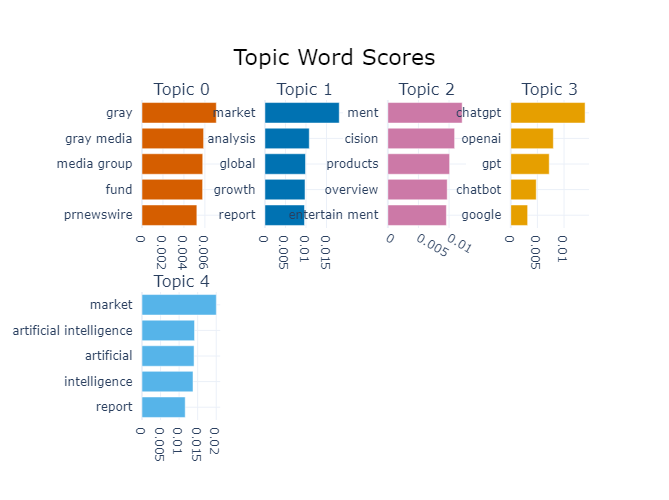

In [ ]:
topic_model.visualize_barchart(top_n_topics=5)

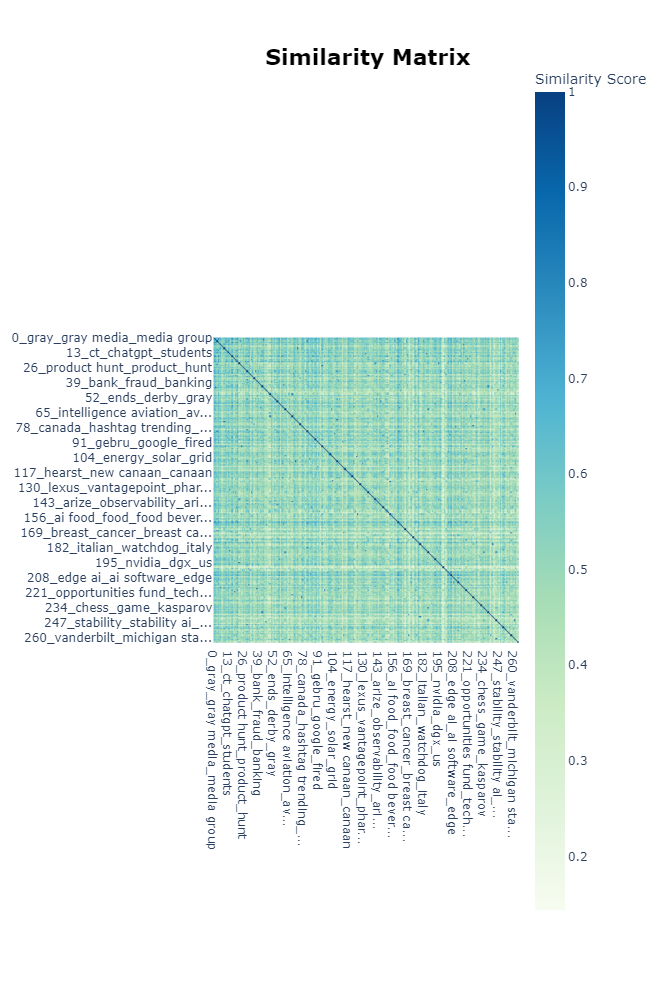

In [ ]:
topic_model.visualize_heatmap(n_clusters=1, width=1000, height=1000)

CPU times: user 19min 15s, sys: 1min 7s, total: 20min 23s
Wall time: 20min 22s


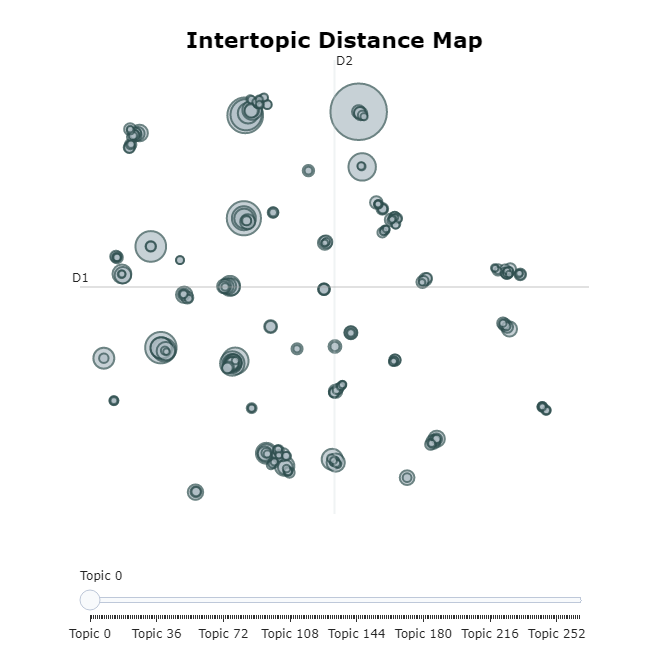

In [178]:
%%time

topic_model.visualize_topics()
#

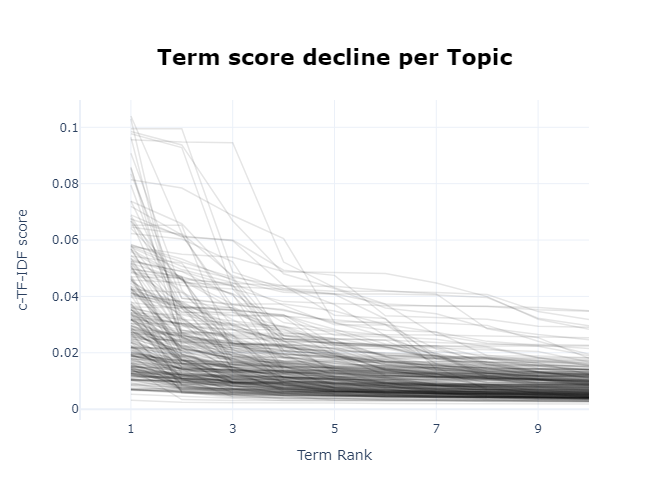

In [ ]:
topic_model.visualize_term_rank()


#### topic search

In [ ]:
similar_topics, similarity = topic_model.find_topics("gpt", top_n=5); similar_topics

[3, 167, 13, 67, 178]

#### topic reduction (removal of outliers)

In [197]:
topic_frequencies = pd.DataFrame(topic_model.get_topic_freq())


In [198]:
topic_frequencies.shape

(266, 2)

In [200]:
topic_frequencies.head(5)

,Topic,Count
0,-1,68052
1,0,7351
2,1,2940
3,2,2689
4,3,2272


In [202]:
# Create a DataFrame of topic frequencies
topic_frequencies = pd.DataFrame(topic_model.get_topic_freq())

# Remove the topic with a topic value of -1
topic_frequencies = topic_frequencies[topic_frequencies['Topic'] != -1]

# Get the count of remaining articles in the topics
remaining_articles = topic_frequencies.shape[0]

# Print the number of remaining articles
print("Number of topics after removing the topic with value -1:", remaining_articles)

# Calculate the sum of the "Count" column
remaining_articles = topic_frequencies['Count'].sum()

# Print the number of remaining articles
print("Number of remaining articles in the topics:", remaining_articles)


Number of topics after removing the topic with value -1: 265
Number of remaining articles in the topics: 96045


#### topic reduction

In [207]:
%%time
new_topics = topic_model.reduce_topics(docs, nr_topics=90)
#topic_mod.reduce_topics(docs, nr_topics = 3) 


2023-05-19 14:35:36,495 - BERTopic - Reduced number of topics from 266 to 37


CPU times: user 8min 59s, sys: 6.26 s, total: 9min 5s
Wall time: 9min 1s


In [208]:
freq = new_topics.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(20)
#xx topics found

Topics found: 37


,Topic,Count,Name
0,-1,68052,-1_ai_news_data_new
1,0,30691,0_us_ai_news_new
2,1,25225,1_market_ai_intelligence_data
3,2,7438,2_ai_days_ago_new
4,3,3130,3_venturebeat_follow_ai_follow us
5,4,3108,4_ai_market_news_retail
6,5,3060,5_starfilled_ai_data_starfilled starfilled
7,6,2651,6_ai_news_ddn_arrow
8,7,2158,7_chatgpt_students_ai_new
9,8,1907,8_drug_market_discovery_edge


In [215]:
new_topics.get_topic(17)  

[('credo', 0.03134197090312124),
 ('credo ai', 0.029289637894103982),
 ('ai', 0.021364997309663143),
 ('space', 0.01223210872399148),
 ('governance', 0.011082271732933127),
 ('responsible ai', 0.01032511197376296),
 ('gatc', 0.008903344752079982),
 ('responsible', 0.008721795149884727),
 ('health', 0.008276982884971964),
 ('nasa', 0.0077473647106864165)]

In [216]:
new_topics.get_topic(3) 

[('venturebeat', 0.01597188872780595),
 ('follow', 0.014127602903932637),
 ('ai', 0.012981971075535325),
 ('follow us', 0.010469748687904267),
 ('data', 0.010306584274660111),
 ('us', 0.010173411915868066),
 ('military', 0.008634568083044592),
 ('intelligence', 0.007597319756642422),
 ('market', 0.0073108331960240955),
 ('share', 0.006798935451960033)]

In [217]:
new_topics.get_topic(14) 

[('automotive', 0.030675455368951512),
 ('market', 0.02592497220755994),
 ('automotive artificial', 0.021189671643562797),
 ('artificial intelligence', 0.01878315727302124),
 ('artificial', 0.018721241311084953),
 ('intelligence', 0.018682329442605117),
 ('argo', 0.017459316139063513),
 ('autonomous', 0.012514170985267381),
 ('report', 0.011301534805286352),
 ('vehicle', 0.010649274380783315)]

In [218]:
new_topics.get_topic(12)  

[('icon', 0.02278914010317371),
 ('musk', 0.02124157090996323),
 ('tesla', 0.0139380790613448),
 ('insider', 0.013328098772487775),
 ('ai', 0.012756757538290059),
 ('indicates', 0.011504085454988409),
 ('elon', 0.010440159853737469),
 ('elon musk', 0.00997111861503895),
 ('arize', 0.008510162294776118),
 ('news', 0.007805877380261475)]

In [219]:
new_topics.get_topic(10)  

[('india', 0.018917263293555153),
 ('news', 0.010147797883290842),
 ('ai', 0.00807539017012378),
 ('vs', 0.007565545891341972),
 ('dh', 0.007293793904058606),
 ('live', 0.00723433961280067),
 ('world', 0.0064906908150264),
 ('day', 0.00614038911634154),
 ('delhi', 0.005938258039939079),
 ('watch', 0.005898813702523529)]

In [220]:
new_topics.get_topic(0)  

[('us', 0.010734809484346389),
 ('ai', 0.010040996436923091),
 ('news', 0.008066518529668791),
 ('new', 0.006582928783344031),
 ('chatgpt', 0.004908856072202207),
 ('intelligence', 0.00490418209487045),
 ('data', 0.004751174246006199),
 ('market', 0.004619518292630521),
 ('artificial', 0.004521241407571895),
 ('technology', 0.004476860592960639)]

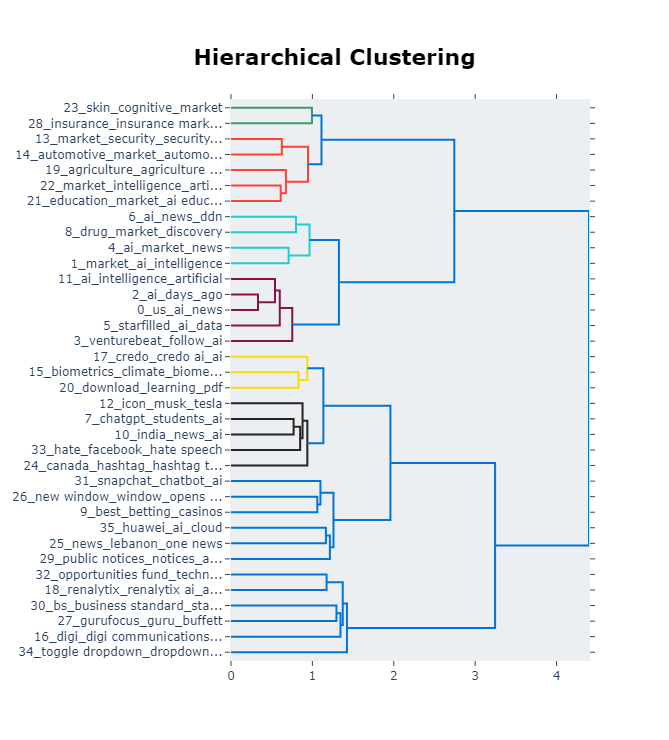

In [210]:
new_topics.visualize_hierarchy(top_n_topics=50)


In [10]:
path_lda = '/home/jupyter'


In [223]:
# Save model - 37 topics
new_topics.save(path_lda +'/lda_model')

# Load model
#saved_model = BERTopic.load(path_lda +'/lda_model')

In [226]:
# Save model - 266 topics
topic_model.save(path_lda +'/lda_model_266')
# Load model
#saved_model = BERTopic.load(path_lda +'/lda_model')

In [279]:
#df_analysis = pd.read_parquet('df_analysis.parquet', engine='pyarrow')
#- seperated from df_analysis into positive and negative
#df_positive = pd.read_parquet('df_positive.parquet', engine='pyarrow')
#df_negative = pd.read_parquet('df_negative.parquet', engine='pyarrow')
#lda_model_266 = topics on 37 topics of general corpus (it is 37 because i probably reduced it)
#lda_model_266 = topics on 37 topics of general corpus


# Bertopics on positive sentiment news 

In [169]:
#removing neutrals
df_analysis = df_analysis[df_analysis['roberta_latest_title_sentiment'] != 'LABEL_1']


In [192]:
df_analysis.to_parquet('df_analysis.parquet', engine='pyarrow')


In [175]:
df_positive = df_analysis[df_analysis['roberta_latest_title_sentiment'] == 'LABEL_2']


In [227]:
#df_positive.to_parquet('df_positive.parquet', engine='pyarrow')


In [229]:
df_positive.shape

(100996, 5)

In [260]:
%%time
docs = df_positive['cleaned_text'].tolist()


CPU times: user 3.01 ms, sys: 0 ns, total: 3.01 ms
Wall time: 3.03 ms


In [231]:
%%time

topic_model_positive = BERTopic(language="english", min_topic_size=30, n_gram_range=(1,2), calculate_probabilities=False, verbose=True)
topics, probs = topic_model_positive.fit_transform(docs)

Batches:   0%|          | 0/3157 [00:00<?, ?it/s]

2023-05-19 15:37:45,889 - BERTopic - Transformed documents to Embeddings
2023-05-19 15:38:59,421 - BERTopic - Reduced dimensionality
2023-05-19 15:39:07,756 - BERTopic - Clustered reduced embeddings


CPU times: user 46min 52s, sys: 5min 55s, total: 52min 47s
Wall time: 20min 39s


In [261]:
%%time
#running again because after reduction to 50 topics even after changing variable name you cannot access previous variable

topic_model_positive = BERTopic(language="english", min_topic_size=30, n_gram_range=(1,2), calculate_probabilities=False, verbose=True)
topics, probs = topic_model_positive.fit_transform(docs)

Batches:   0%|          | 0/3157 [00:00<?, ?it/s]

2023-05-19 17:16:47,164 - BERTopic - Transformed documents to Embeddings
2023-05-19 17:17:52,203 - BERTopic - Reduced dimensionality
2023-05-19 17:18:00,131 - BERTopic - Clustered reduced embeddings


CPU times: user 41min 39s, sys: 6min 33s, total: 48min 13s
Wall time: 19min 10s


In [262]:
#checking with below because it was rerun
freq = topic_model_positive.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(20)
#xx topics found

Topics found: 755


,Topic,Count,Name
0,-1,30397,-1_ai_news_data_new
1,0,2283,0_market_analysis_players_growth
2,1,2060,1_ment_cision_entertain ment_entertain
3,2,872,2_intelligence software_market_artificial intelligence_artificial
4,3,863,3_days_software days_may also_nationsmiddle eastafghanistaneuropeindiau
5,4,843,4_laivly_gray_gray media_media group
6,5,787,5_learning market_machine learning_machine_learning
7,6,784,6_und_zu_die_hoc
8,7,773,7_newswires_us_presswire_ein presswire
9,8,735,8_wfmz_wfmz tv_lehigh_berks


In [263]:
topic_model_positive.get_topic(0)  # Select the most frequent topic

[('market', 0.006351688447625568),
 ('analysis', 0.004923013611003048),
 ('players', 0.0047061695399391165),
 ('growth', 0.004649534207824899),
 ('report', 0.004449352784590002),
 ('global', 0.004313027856453599),
 ('forecast', 0.004172499522282458),
 ('key', 0.004056633436015475),
 ('corporation', 0.003824824104588242),
 ('trends', 0.0037736808075665936)]

#### Visualize Topic Hierarchy

#### The topics that were created can be hierarchically reduced. In order to understand the potential hierarchical structure of the topics, we can use scipy.cluster.hierarchy to create clusters and visualize how they relate to one another. This might help selecting an appropriate nr_topics when reducing the number of topics that you have created.

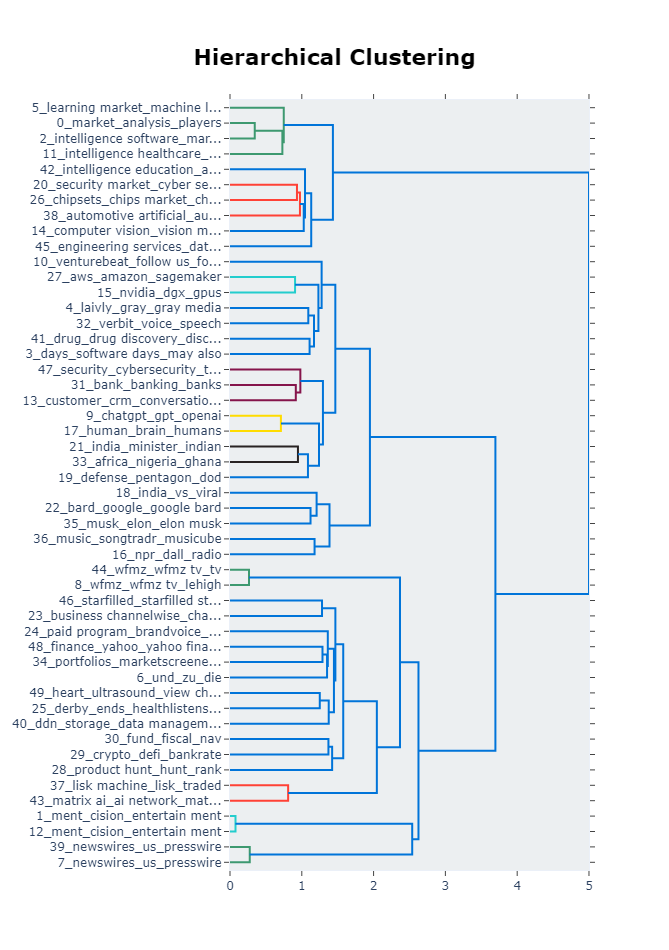

In [264]:
topic_model_positive.visualize_hierarchy(top_n_topics=50)


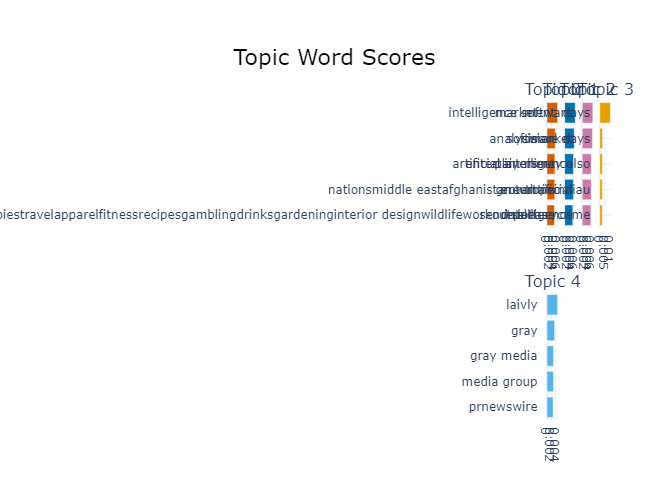

In [265]:
topic_model_positive.visualize_barchart(top_n_topics=5)

#### topic reduction (to 310 topics)

In [266]:
new_topics_positive = topic_model_positive.reduce_topics(docs, nr_topics=310)
#topic_mod.reduce_topics(docs, nr_topics = 3) 


2023-05-19 17:31:42,009 - BERTopic - Reduced number of topics from 755 to 310


In [267]:
freq = new_topics_positive.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
#freq.head(200)
#xx topics found
# Set the display options to show more rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the dataframe
freq.head(200)


Topics found: 310


,Topic,Count,Name
0,-1,30397,-1_ai_news_data_new
1,0,3799,0_us_wfmz_newswires_tv
2,1,3414,1_market_analysis_growth_global
3,2,2833,2_ment_cision_products_entertain ment
4,3,1700,3_stocks_stock_screener_finance
5,4,1688,4_machine learning_machine_learning_market
6,5,1610,5_india_news_live_vs
7,6,1420,6_chatgpt_openai_bing_microsoft
8,7,1307,7_und_zu_die_sie
9,8,1276,8_market_artificial intelligence_artificial_intelligence


In [268]:

# Reset the display options to the default values (optional)
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')


In [288]:
freq = new_topics_positive.get_topic_info()

print(f"Topics found: {freq.shape[0]}")


Topics found: 310


In [284]:
# Save model - 310 topics_positive
new_topics_positive.save(path_lda +'/lda_model_positive_310')
# Load model
#saved_model = BERTopic.load(path_lda +'/lda_model')

In [ ]:
#leverage this below is key for this topic search 
#topic_model.get_document_info(docs)


In [289]:
df_topics_positive = new_topics_positive.get_document_info(docs)


In [291]:
#removing outliers
df_topics_positive = df_topics_positive[df_topics_positive['Topic'] != -1]


In [290]:
df_topics_positive["Representative_document"].value_counts()
#after removing -1 (outliers)

False    100045
True        951
Name: Representative_document, dtype: int64

In [302]:
#df_topics_positive.to_parquet('df_topics_positive.parquet', engine='pyarrow')

# Reloading Dataframe and LDA Model

In [11]:
new_topics_positive = BERTopic.load(path_lda +'/lda_model_positive_310')

In [5]:
df_topics_positive = pd.read_parquet('df_topics_positive.parquet', engine='pyarrow')


#### topic search - Chat GPT

In [12]:
similar_topics, similarity = new_topics_positive.find_topics("chat gpt", top_n=10); similar_topics

[6, 237, 184, 29, 58, 198, 59, 122, 2, 91]

In [13]:
similar_topics, similarity = new_topics_positive.find_topics("chatgpt", top_n=10); similar_topics

[6, 237, 29, 184, 26, 302, 58, 122, 62, 91]

In [14]:
similar_topics, similarity = new_topics_positive.find_topics("gpt", top_n=10); similar_topics

[6, 237, 198, 58, 59, 122, 12, 2, 90, 141]

In [15]:
#chatgpt
selected_topics = [6, 237, 184, 29, 58, 198, 59, 122, 2, 91]
chatgpt_df = df_topics_positive[df_topics_positive['Topic'].isin(selected_topics)]


In [16]:
chatgpt_df.head(1)

,Document,Topic,Name,Top_n_words,Probability,Representative_document
11,italy restores chatgpt openai responds regulator searchworldentertainmentlifestyleeconomybusinesscrickethellostriperecentbeta technologyitaly restores chatgpt openai responds regulatormicrosoft corp backed openai took chatgpt offline italy last month country data protection authority temporarily banned chatbotsupantha mukherjee giselda vagnonireuterspublished april pm updated april pm chatgpt chatbot reactivated italy maker openai addressed issues raised italy data protection authority agenc...,6,6_chatgpt_openai_bing_microsoft,chatgpt - openai - bing - microsoft - gpt - chatbot - users - new - google - search,1.0,False


In [20]:
chatgpt_df['Name'].value_counts()

2_ment_cision_products_entertain ment                   2833
6_chatgpt_openai_bing_microsoft                         1420
29_bard_google_chatgpt_pichai                            523
58_lunit_lunit insight_cancer_breast                     295
59_gartner_zest_gartner cool_cool                        292
91_reviews_tiktok twitter_linkedin pinterest_tiktok      183
122_gatc_gatc health_accuray_limbus                      137
184_snapchat_chatbot_snap_ai chatbot                      81
198_document_grooper_sortspoke_document processing        69
237_mathgpt_shutterstock_mathgpt platform_photostudy      49
Name: Name, dtype: int64

In [17]:
chatgpt_df.shape

(5882, 6)

In [18]:
import spacy
from spacy import displacy
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load the spaCy model
nlp = spacy.load('en_core_web_sm')

# Initialize the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to analyze sentence sentiment and named entities
def analyze_sentence(sent):
    # Analyze sentiment using VADER
    sentiment_scores = analyzer.polarity_scores(sent)
    
    # Extract named entities
    doc = nlp(sent)
    named_entities = [ent.text for ent in doc.ents]
    
    return sentiment_scores, named_entities

# Function to process each document
def process_document(document):
    sentences = [sent.text for sent in nlp(document).sents]
    sentiment_results = []
    positive_sentences = []
    negative_sentences = []
    
    for sentence in sentences:
        sentiment_scores, named_entities = analyze_sentence(sentence)
        sentiment_results.append(sentiment_scores)
        
        # Check for really positive and really negative sentences
        if sentiment_scores['compound'] >= 0.8:
            positive_sentences.append((sentence, named_entities))
        elif sentiment_scores['compound'] <= -0.8:
            negative_sentences.append((sentence, named_entities))
    
    return sentiment_results, positive_sentences, negative_sentences

# Apply the analysis to each document in the DataFrame
chatgpt_df['Sentiment_Results'], chatgpt_df['Positive_Sentences'], chatgpt_df['Negative_Sentences'] = zip(*chatgpt_df['Document'].apply(process_document))

# Print the positive and negative sentences with named entities
# for index, row in chatgpt_df.iterrows():
#     print(f"Document {index + 1}:")
#     print("Positive Sentences:")
#     for sentence, named_entities in row['Positive_Sentences']:
#         print("- Sentence:", sentence)
#         print("  Named Entities:", named_entities)
#     print("Negative Sentences:")
#     for sentence, named_entities in row['Negative_Sentences']:
#         print("- Sentence:", sentence)
#         print("  Named Entities:", named_entities)
#     print("\n")


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [30]:
from collections import Counter

# Initialize empty lists to store counts
positive_counts = []
negative_counts = []

# Loop through each document
for index, row in chatgpt_df.iterrows():
    positive_sentences = row['Positive_Sentences']
    negative_sentences = row['Negative_Sentences']
    
    # Count the number of positive and negative sentences
    positive_count = len(positive_sentences)
    negative_count = len(negative_sentences)
    
    # Append the counts to the respective lists
    positive_counts.append(positive_count)
    negative_counts.append(negative_count)

# Add the counts as separate columns in the DataFrame
chatgpt_df['Positive_Sentence_Count'] = positive_counts
chatgpt_df['Negative_Sentence_Count'] = negative_counts


In [31]:
chatgpt_df.head(10)

,Document,Topic,Name,Top_n_words,Probability,Representative_document,Sentiment_Results,Positive_Sentences,Negative_Sentences,Positive_Sentence_Count,Negative_Sentence_Count
11,italy restores chatgpt openai responds regulator searchworldentertainmentlifestyleeconomybusinesscrickethellostriperecentbeta technologyitaly restores chatgpt openai responds regulatormicrosoft corp backed openai took chatgpt offline italy last month country data protection authority temporarily banned chatbotsupantha mukherjee giselda vagnonireuterspublished april pm updated april pm chatgpt chatbot reactivated italy maker openai addressed issues raised italy data protection authority agency company confirmed friday microsoft corp backed openai took chatgpt offline italy last month country data protection authority also known garante temporarily banned chatbot launched probe artificial intelligence application suspected breach privacy rules garante given deadline till sunday openai address concerns allowing chatbot start operating country last month garante said chatgpt absence legal basis justifies massive collection storage personal data train chatbot garante also accused openai failing check age chatgpt users supposed aged openai said offer tool verify users ages italy upon sign company said friday provide greater visibility privacy policy user content opt form also provide new form european union users exercise right object use personal data train models company spokesperson said form requires people want opt provide detailed personal information including evidence data processing via relevant prompts garante said recognises steps taken combine technological progress respect people rights hopes company continue along path compliance european data protection regulations italy first western european country curb chatgpt rapid development attracted attention lawmakers regulators several countries committee european union lawmakers thursday agreed new rules would force companies deploying generative ai tools chatgpt disclose copyrighted material used develop systems following garante interest chatgpt european data protection board body unites europe national privacy watchdogs set task force chatbot earlier month garante said continue probe chatgpt work special task force related storiesitaly curbs chatgpt starts probe privacy concernsthe country data protection authority accused microsoft corp backed chatbot failing check age users supposed aged abovegermany principle could block chat gpt neededthe country requested information italy temporary banchatgpt resume italy meets data watchdog demandsalmost two weeks ago openai took chatgpt offline italy authority known garante temporarily restricted personal data processing began probeaustralian mayor readies world first defamation lawsuit chatgpt contentthe nature defamatory statements serious enough may claim partner hood lawfirm gordon legal saidopiniona tribute sculptor syed abdullah khalidadoption heavenly blisswho instigated dr imtiaz malign bangabandhu fake story light easterread editor chief publisher toufique imrose khalidifollow usdisclaimer privacy policyabout uscontact uscopyright,6,6_chatgpt_openai_bing_microsoft,chatgpt - openai - bing - microsoft - gpt - chatbot - users - new - google - search,1.000000,False,"[{'neg': 0.073, 'neu': 0.803, 'pos': 0.124, 'compound': 0.8519}, {'neg': 0.13, 'neu': 0.786, 'pos': 0.085, 'compound': -0.3818}]","[(italy restores chatgpt openai responds regulator searchworldentertainmentlifestyleeconomybusinesscrickethellostriperecentbeta technologyitaly restores chatgpt openai responds regulatormicrosoft corp backed openai took chatgpt offline italy last month country data protection authority temporarily banned chatbotsupantha mukherjee giselda vagnonireuterspublished april pm updated april pm chatgpt chatbot reactivated italy maker openai addressed issues raised italy data protection authority agency company confirmed friday microsoft corp backed openai took chatgpt 

In [27]:
positive_counts = []
negative_counts = []
named_entities_list = []

for document in chatgpt_df['Document']:
    positive_counts.append(len(positive_sentences))
    negative_counts.append(len(negative_sentences))
    named_entities_list.append(named_entities)

# Add the counts and named entities as separate columns in the DataFrame
chatgpt_df['Positive_Sentence_Count'] = positive_counts
chatgpt_df['Negative_Sentence_Count'] = negative_counts
chatgpt_df['Named_Entities'] = named_entities_list


NameError: name 'positive_sentences' is not defined

In [24]:
# expand length of column width
pd.set_option('display.max_colwidth', 3000)

In [300]:
df_topics_positive.shape

(70599, 6)

#### extract entities from this chatgpt df

In [84]:
#!pip install spacy

In [94]:
#!python -m spacy download en_core_web_sm


In [308]:
import spacy 
from spacy import displacy
from spacy.util import minibatch, compounding
from tqdm import tqdm
spacy.prefer_gpu()
#spacy.require_gpu()

print(spacy.__version__)


2023-05-19 21:52:42.873177: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-19 21:52:42.875085: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-19 21:52:42.881603: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

3.5.3


In [309]:
nlp = spacy.load("en_core_web_sm",exclude=['tok2vec','lemmatizer'])


In [310]:
title_entities = []
for doc in nlp.pipe(
    texts = chatgpt_df['Document'],
):
    ents = []
    for ent in doc.ents:
        if ent.label_ in ['ORG']:
            ents.append(ent.text)
    title_entities.append(ents)

In [311]:
chatgpt_df['org'] = title_entities


In [312]:
chatgpt_df['org'].explode().value_counts().reset_index().head(20)


,index,org
0,microsoft,7462
1,fda,5798
2,google,4630
3,gpt,3924
4,czech denmark finland,2511
5,nederland,2334
6,united kingdom services,2196
7,ibm,1795
8,cision us inc,1727
9,media group inc station gray television inc,662


In [316]:
chatgpt_df.head(1)

,Document,Topic,Name,Top_n_words,Probability,Representative_document,org
11,italy restores chatgpt openai responds regulator searchworldentertainmentlifestyleeconomybusinesscrickethellostriperecentbeta technologyitaly restores chatgpt openai responds regulatormicrosoft corp backed openai took chatgpt offline italy last month country data protection authority temporarily banned chatbotsupantha mukherjee giselda vagnonireuterspublished april pm updated april pm chatgpt chatbot reactivated italy maker openai addressed issues raised italy data protection authority agenc...,6,6_chatgpt_openai_bing_microsoft,chatgpt - openai - bing - microsoft - gpt - chatbot - users - new - google - search,1.0,False,"[regulatormicrosoft corp, italy data protection authority agency, microsoft corp, european union, european data protection regulations, european union, european data protection board, microsoft corp, abdullah khalidadoption]"


In [108]:
from nltk.sentiment import SentimentIntensityAnalyzer

# Initialize the sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Function to perform aspect-based sentiment analysis
def perform_aspect_sentiment_analysis(text):
    # Tokenize the text into sentences
    sentences = nltk.sent_tokenize(text)
    
    # Analyze sentiment for each sentence
    sentiment_scores = []
    for sentence in sentences:
        sentiment = sia.polarity_scores(sentence)
        sentiment_scores.append(sentiment['compound'])
    
    # Return the average sentiment score for the text
    return sum(sentiment_scores) / len(sentiment_scores)

# Apply aspect-based sentiment analysis to the 'text' column of your DataFrame
chatgpt_df_1['aspect_sentiment'] = chatgpt_df_1['Document'].apply(perform_aspect_sentiment_analysis)


In [325]:
#!pip install vaderSentiment

In [334]:
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to perform targeted sentiment analysis
def perform_targeted_sentiment_analysis(row, target_entity):
    text = row['Document']
    sentiment_scores = analyzer.polarity_scores(text)
    compound_score = sentiment_scores['compound']
    
    # Check if the target entity is mentioned in the text
    if target_entity.lower() in text.lower():
        if compound_score >= 0.05:
            sentiment = 'positive'
        elif compound_score <= -0.05:
            sentiment = 'negative'
        else:
            sentiment = 'neutral'
        return sentiment
    else:
        return 'not mentioned'

# Example target entity
target_entity = "innovation"

# Perform targeted sentiment analysis on the chatgpt_df dataframe
chatgpt_df['Sentiment_innovation'] = chatgpt_df.apply(perform_targeted_sentiment_analysis, target_entity=target_entity, axis=1)

# Interpret the sentiment analysis results
sentiment_counts = chatgpt_df['Sentiment_innovation'].value_counts()
positive_count = sentiment_counts.get('positive', 0)
negative_count = sentiment_counts.get('negative', 0)
neutral_count = sentiment_counts.get('neutral', 0)

# Calculate the percentage of positive, negative, and neutral sentiment
total_count = len(chatgpt_df)
positive_percentage = (positive_count / total_count) * 100
negative_percentage = (negative_count / total_count) * 100
neutral_percentage = (neutral_count / total_count) * 100

# Interpretation of sentiment analysis results
interpretation = f"In the {total_count} analyzed documents, the sentiment towards {target_entity} is as follows:\n"
interpretation += f"Positive: {positive_count} documents ({positive_percentage:.2f}%)\n"
interpretation += f"Negative: {negative_count} documents ({negative_percentage:.2f}%)\n"
interpretation += f"Neutral: {neutral_count} documents ({neutral_percentage:.2f}%)"

# Print the interpretation
print(interpretation)


In the 5882 analyzed documents, the sentiment towards innovation is as follows:
Positive: 1681 documents (28.58%)
Negative: 11 documents (0.19%)
Neutral: 0 documents (0.00%)


In [335]:
#chatgpt_df = chatgpt_df.drop("Sentiment_Score_Microsoft", axis=1)
chatgpt_df

,Document,Topic,Name,Top_n_words,Probability,Representative_document,org,Sentiment_innovation
11,italy restores chatgpt openai responds regulator searchworldentertainmentlifestyleeconomybusinesscrickethellostriperecentbeta technologyitaly restores chatgpt openai responds regulatormicrosoft corp backed openai took chatgpt offline italy last month country data protection authority temporarily banned chatbotsupantha mukherjee giselda vagnonireuterspublished april pm updated april pm chatgpt chatbot reactivated italy maker openai addressed issues raised italy data protection authority agenc...,6,6_chatgpt_openai_bing_microsoft,chatgpt - openai - bing - microsoft - gpt - chatbot - users - new - google - search,1.000000,False,"[regulatormicrosoft corp, italy data protection authority agency, microsoft corp, european union, european data protection regulations, european union, european data protection board, microsoft corp, abdullah khalidadoption]",not mentioned
143,google invests ai start anthropic rival chatgpt sg th hk style fashion grooming watches culture art design events film tv living music gear motoring tech food drink dining drinks travel hotels resorts travel guides wellness fitness health select listers august mentors hit list e magazine style fashion grooming watches culture art design events film tv living music gear motoring tech food drink dining drinks travel hotels resorts travel guides wellness fitness health select e magazine home ge...,29,29_bard_google_chatgpt_pichai,bard - google - chatgpt - pichai - chatbot - google bard - search - opens - opens new - ago,0.995794,False,"[google, google, microsoft, google, new york times, google, google, samsung, chatbot march, samsung]",not mentioned
156,openai ceo plans japan expansion prime minister meeting bnn bloomberg currentboardshortname markets indices currencies energy metals data symbol reutersriclabelformat group rics data netchng number data netchng number data displaycurrencysymbol data price number data price number data symbol reutersriclabelformat group rics data netchng number data netchng number data displaycurrencysymbol data price number data price number markets timestamp date timestamp time markets currentboardshortname...,6,6_chatgpt_openai_bing_microsoft,chatgpt - openai - bing - microsoft - gpt - chatbot - users - new - google - search,1.000000,False,"[fed, fx, japan inc sells, fed, blackrock wait forever sell, ipo singapore, xinhua, fed, npr, media bank korea, xinhua, fed, fed, chase canada, trreb energy, board canada national office vacancy, bank canada, fox news, supreme court thomas, warner bros discovery, xinhua, npr, media bank korea, goldman sachs faulted investor, bloomberg news, martin, fed, apple jpmorgan, america oil reserve, fed, fed, etfs news, billion esg, sec, cftc, suncor, netflix, onex bobby le blanc, dominic barton canad...",not mentioned
157,lecture appointment six authoritative experts talk chatgpt generative ai bring small revolution life sciences leifeng com breakinglatest news breaking latest news home business entertainment health news sports world technology search home business lecture appointment six authoritative experts talk chatgpt generative ai bring small revolution life sciences leifeng com business lecture appointment six authoritative experts talk chatgpt generative ai bring small revolution life sciences leifeng...,6,6_chatgpt_openai_bing_microsoft,chatgpt - openai - bing - microsoft - gpt - chatbot - users - new - google - search,1.000000,False,"[business entertainment health news, byte, dean school computer science control engineering, china professor academy mathematical sciences, renmin university, china computer federation co researcher beijing, harvard university, sci, pan shenzhen university technology chinese academy sciences preparation school computer science control engineering, shenzhen university technology chinese academy sciences chair, american academy medicine biological, national academy, academic

#### reduction to 100 topics (50 was too less because 45000 articles was in top 1) - TRY THIS LATER!

In [256]:
new_topics_positive_50 = new_topics_positive.reduce_topics(docs, nr_topics=100)
#topic_mod.reduce_topics(docs, nr_topics = 3) 


2023-05-19 17:01:41,092 - BERTopic - Reduced number of topics from 50 to 50


In [257]:
freq = new_topics_positive_50.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
#freq.head(200)
#xx topics found
# Set the display options to show more rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the dataframe
freq.head(20)


Topics found: 50


,Topic,Count,Name
0,-1,30394,-1_ai_news_market_us
1,0,45452,0_ai_market_news_data
2,1,4489,1_healthcare_market_health_medical
3,2,2707,2_market_intelligence_artificial intelligence_artificial
4,3,2382,3_market_security_intelligence_artificial intelligence
5,4,2119,4_ai_news_world_new
6,5,1547,5_ddn_data_cloud_ai
7,6,1443,6_days_ago_hours_hours ago
8,7,1406,7_automotive_market_automotive artificial_artificial
9,8,1399,8_ai_deepbrain_deepbrain ai_market


In [250]:

# Reset the display options to the default values (optional)
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')


CPU times: user 1.15 s, sys: 3.97 ms, total: 1.15 s
Wall time: 1.15 s


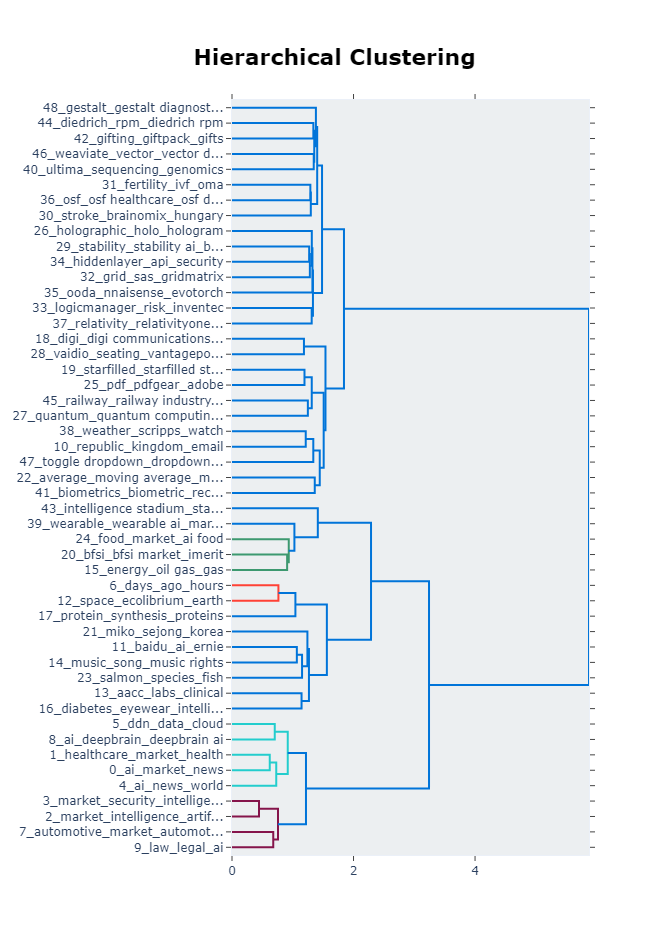

In [251]:
%%time

new_topics_positive_50.visualize_hierarchy(top_n_topics=50)

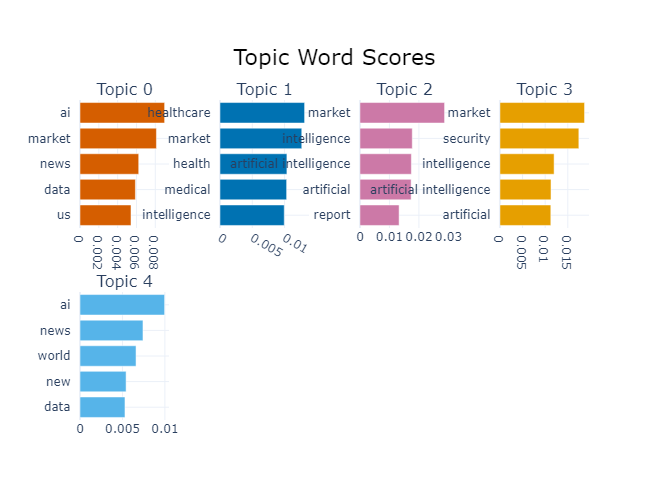

In [252]:
new_topics_positive_50.visualize_barchart(top_n_topics=5)

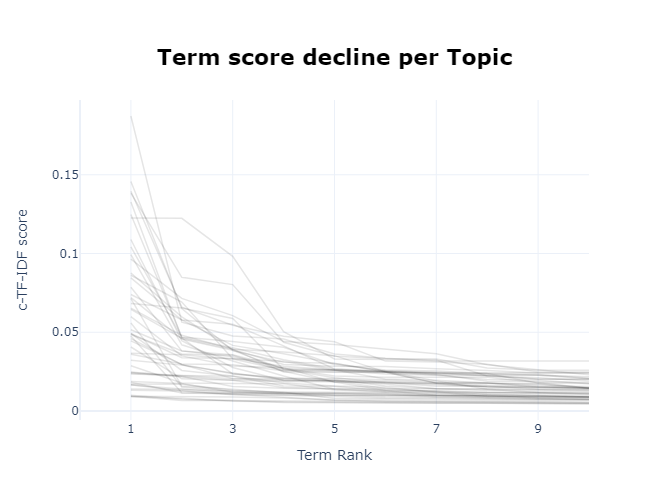

In [253]:
new_topics_positive_50.visualize_term_rank()

#### Fine-tuning positive topics - 50

In [ ]:
new_topics_positive_50.update_topics(docs, topics, n_gram_range=(1, 3))

In [ ]:
topic_model.visualize_heatmap(n_clusters=1, width=1000, height=1000)

In [ ]:
%%time
#20 mins

topic_model.visualize_topics()
#

In [ ]:
topic_model.visualize_term_rank()


#### topic search

In [ ]:
similar_topics, similarity = topic_model.find_topics("gpt", top_n=5); similar_topics

#### topic reduction (removal of outliers)

In [ ]:
topic_frequencies = pd.DataFrame(topic_model.get_topic_freq())


In [ ]:
topic_frequencies.shape

In [ ]:
topic_frequencies.head(5)

In [ ]:
# Create a DataFrame of topic frequencies
topic_frequencies = pd.DataFrame(topic_model.get_topic_freq())

# Remove the topic with a topic value of -1
topic_frequencies = topic_frequencies[topic_frequencies['Topic'] != -1]

# Get the count of remaining articles in the topics
remaining_articles = topic_frequencies.shape[0]

# Print the number of remaining articles
print("Number of topics after removing the topic with value -1:", remaining_articles)

# Calculate the sum of the "Count" column
remaining_articles = topic_frequencies['Count'].sum()

# Print the number of remaining articles
print("Number of remaining articles in the topics:", remaining_articles)


# Entity Extraction Sample Code on Original Data

# NER using NLTK (DONT RUN) - ran only sample

In [13]:
def find_company_nltk(string):
    tokens = nltk.word_tokenize(string)    
    entities = []
    for chunk in nltk.ne_chunk(nltk.pos_tag(tokens), binary = False):
        if hasattr(chunk, 'label'):
            entity = ' '.join(c[0] for c in chunk)
            label = chunk.label()
            if label == 'ORGANIZATION':
                entities.append(entity)
    return(entities)

In [14]:
    def find_company_by_sentences_nltk(string):
        entities = []
        for sent in nltk.sent_tokenize(string):
            for chunk in nltk.ne_chunk(nltk.pos_tag(nltk.word_tokenize(sent)), binary = False):
                if hasattr(chunk, 'label'):
                    entity = ' '.join(c[0] for c in chunk)
                    label = chunk.label()
                    if label == 'ORGANIZATION':
                        entities.append(entity)
        return(entities)

In [15]:
#takes too long to run on 1000 sample
#DONT RUN
df_filtered_sample['companies'] = df_filtered_sample['text'].apply(find_company_nltk)
df_filtered_sample['companies_sentences'] = df_filtered_sample['text'].apply(find_company_by_sentences_nltk)


In [20]:
df_filtered_sample.head()

,url,date,language,title,text,content_clean,clean_title,cleaned_text,sentiment,confidence_score,companies,companies_sentences
96091,http://www.hardware.broadcastnewsroom.com/2020/04/24/aws-announces-general-availability-of-amazon-augmented-artificial-intelligence-a2i/?utm_source=rss&utm_medium=rss&utm_campaign=aws-announces-general-availability-of-amazon-augmented-artificial-intelligence-a2i,2020-04-24,en,AWS Announces General Availability of Amazon Augmented Artificial Intelligence (A2I) | | Broadcast Newsroom,\n\nAWS Announces General Availability of Amazon Augmented Artificial Intelligence (A2I) | | Broadcast Newsroom\n \n\nSkip to content\nBroadcast Newsroom\n\nNews & Information for Broadcast Professionals\n\nPrimary Menu\n\nSearch for:\n \nHome2020April24AWS Announces General Availability of Amazon Augmented Artificial Intelligence (A2I) \n\n \n\n \n News\n \n \nAWS Announces General Availability of Amazon Augmented Artificial Intelligence (A2I)\n\n\nBy\n\n BN Staff \n\n\n 3 hours ago \n\...,AWS Announces General Availability Amazon Augmented Artificial Intelligence A2I Broadcast Newsroom Skip content Broadcast Newsroom News Information Broadcast Professionals Primary Menu Search Home2020April24AWS Announces General Availability Amazon Augmented Artificial Intelligence A2I News AWS Announces General Availability Amazon Augmented Artificial Intelligence A2I By BN Staff 3 hours ago Amazon A2I makes easier developers build manage workflows validate machine learning predictions human reviewers National Health Service NHS UK T Mobile Deloitte among customers partners using Amazon A...,AWS Announces General Availability Amazon Augmented Artificial Intelligence A2I Broadcast Newsroom,aws announces general availability amazon augmented artificial intelligence broadcast newsroom skip content broadcast newsroom news information broadcast professionals primary menu search announces general availability amazon augmented artificial intelligence news aws announces general availability amazon augmented artificial intelligence bn staff hours ago amazon makes easier developers build manage workflows validate machine learning predictions human reviewers national health service nhs uk mobile deloitte among customers partners using amazon seattle business wire today amazon web serv...,neutral,0.902667,"[AWS, Amazon, Amazon, News, Amazon, BN, National Health Service, NHS, BUSINESS, AWS, NASDAQ, Amazon, Mechanical Turk, Augmented, API, CapeStart Inc., iMerit, Amazon, CloudWatch, Amazon A2I, Ohio, Central, National Health Service, Business Services, NHS, UK National Health Service, NHS, NHS, NHS, UK, Innovation, NHS, AI, America, Part, Deloitte Consulting, ML, Belle Fleur, AWS, IoT, VR, AZs, AWS Regions, AWS, AWS, AWS, Fire, AmazonNews, Continue, Host Nickelodeon, DIT Education Electronics Encoder Feature, Metadata Monitor Music Music Video, NAB News People Post, Host Nickelodeon, AWS Annou...","[AWS, Amazon, Amazon, News, Amazon, BN, National Health Service, NHS, BUSINESS, AWS, NASDAQ, Amazon, A2I, Mechanical Turk, A2I, A2I, Augmented, API, iVision, CapeStart Inc., iMerit, Amazon, CloudWatch, Amazon A2I, Ohio, Central, National, Business Services, NHS, UK National Health Service, NHS, NHS, NHS, UK, Innovation, NHS, Amazon Textract, AI, America, Part, Deloitte Consulting, ML, Belle Fleur, AWS, IoT, VR, AZs, AWS Regions, AWS, AWS, AWS, Fire, AmazonNews, Continue, Host Nickelodeon, DIT Education Electronics Encoder Feature, Metadata Monitor Music Music Video, NAB News People Post, H..."
91201,https://businessday.ng/news/article/nigerians-query-chatgpt-on-how-to-win-tinubu-others/,2023-01-15,en,"Nigerians query ChatGPT on 'How to win Tinubu', others - Businessday NG","\n\nNigerians query ChatGPT on 'How to win Tinubu', others - Businessday NG\n\n\r\n \n\n \n\n \n\n \n\nNews\nAhmed Bola Tinubu,BDrecent\nBusinessDay\n\nHome\nBig Story\nNews\n\nWorld\n\nAfrica\n\n\nLegal Business\nSports.\nEducation\n\n\nNigeriaDecides2023\nCompanies\nEconomy\n\nAgr

In [19]:
df_filtered_sample[df_filtered_sample['companies_sentences'].str.len() != 0][['companies','companies_sentences']].head(15)


,companies,companies_sentences
96091,"[AWS, Amazon, Amazon, News, Amazon, BN, National Health Service, NHS, BUSINESS, AWS, NASDAQ, Amazon, Mechanical Turk, Augmented, API, CapeStart Inc., iMerit, Amazon, CloudWatch, Amazon A2I, Ohio, Central, National Health Service, Business Services, NHS, UK National Health Service, NHS, NHS, NHS, UK, Innovation, NHS, AI, America, Part, Deloitte Consulting, ML, Belle Fleur, AWS, IoT, VR, AZs, AWS Regions, AWS, AWS, AWS, Fire, AmazonNews, Continue, Host Nickelodeon, DIT Education Electronics Encoder Feature, Metadata Monitor Music Music Video, NAB News People Post, Host Nickelodeon, AWS Annou...","[AWS, Amazon, Amazon, News, Amazon, BN, National Health Service, NHS, BUSINESS, AWS, NASDAQ, Amazon, A2I, Mechanical Turk, A2I, A2I, Augmented, API, iVision, CapeStart Inc., iMerit, Amazon, CloudWatch, Amazon A2I, Ohio, Central, National, Business Services, NHS, UK National Health Service, NHS, NHS, NHS, UK, Innovation, NHS, Amazon Textract, AI, America, Part, Deloitte Consulting, ML, Belle Fleur, AWS, IoT, VR, AZs, AWS Regions, AWS, AWS, AWS, Fire, AmazonNews, Continue, Host Nickelodeon, DIT Education Electronics Encoder Feature, Metadata Monitor Music Music Video, NAB News People Post, H..."
91201,"[ChatGPT, BDrecent, ChatGPT, All, Congress Bola Ahmed Tinubu, AnD Ventures, CEO, Paga Communications, APC, ChatGPT, Intelligence Unit, ChatGPT, ChatGPT, ChatGPT, AI, ChatGPT, Central Bank, ChatGPT, OpenAI, AI, ChatGPT, News Nigeria, News, INEC, CBN, N103bn, WhatsApp Us, Conditions, INEC, All Rights Reserved, Digital Team Home]","[ChatGPT, BDrecent, NigeriaDecides2023, ChatGPT, All, Congress Bola Ahmed Tinubu, AnD Ventures, CEO, Paga Communications, APC, ChatGPT, Intelligence Unit, ChatGPT, ChatGPT, ChatGPT, AI, ChatGPT, Central Bank, OpenAI, AI, ChatGPT, News Nigeria, News, INEC, CBN, N103bn, WhatsApp Us, Conditions, INEC, Digital Team Home, NigeriaDecides2023]"
154436,"[contentNC, DHHS, WBTV News Team, InvestigatesOn, WBTV News Team, TrafficWatch, ThomasCabarrus, CountryIredell, GradeCollect, ConnectCoronavirus, GrillTasty Beverages, DessertsGood News, DebtNC, TVOn, NewsCarolina, Helpers, HeroesKomen Race For The, CureConsumerAutism, FamilyMolly, KidsSportsCarolina, MLSHigh, NightPowerNationInvestigate, BureauCircle, LifestyleLatest, NewscastsPress, agoThe, globallyMastercard, Northrop, Responsible, FRANCISCO, RAI, AI Fund, PRNewswire, IDC, AI, Responsible, Responsible, Responsible, AI, MLOps, AI, Responsible, Responsible, EVP, Responsible, National Arti...","[contentNC, DHHS, WBTV News Team, InvestigatesOn, WBTV News Team, TrafficWatch, ThomasCabarrus, CountryIredell, GradeCollect, ConnectCoronavirus, GrillTasty Beverages, DessertsGood News, DebtNC, TVOn, NewsCarolina, Helpers, HeroesKomen Race For The, CureConsumerAutism, FamilyMolly, KidsSportsCarolina, MLSHigh, NightPowerNationInvestigate, BureauCircle, LifestyleLatest, NewscastsPress, agoThe, globallyMastercard, Northrop, Responsible, FRANCISCO, RAI, AI Fund, PRNewswire, IDC, AI, Responsible, Responsible, Responsible, AI, MLOps, AI, Responsible, Responsible, EVP, Responsible, National Arti..."
69217,"[News Reviews Phones, VPN, News Video Magazine Black, VPN, TechRadar, CES, Samsung, Samsung, Things, IoT, TVs, CES, IoT, TVs, TechRadar, TechRadar, PRODUCT Laptop, PS5, PS5, Intel Rocket, Samsung Galaxy S21, iPhone, TechRadar, House, Ambury]","[News Reviews Phones, VPN, News Video Magazine Black, VPN, TechRadar, CES, Samsung, Samsung, Things, IoT, TVs, CES, IoT, TVs, TechRadar, TechRadar, PRODUCT Laptop, PS5, PS5, Intel Rocket, Samsung Galaxy S21, iPhone, TechRadar, House, Ambury]"
196372,"[Moderate, Courier, Automatic, TSK, ADT, Advanced Dicing Technologies, IC, Separation Device, LED Package, Moderate, Regional Forecast, Latest Innovations, BioWorld, Corning Lithium, Arborist Software Market, Steady Pace, Forecast, Microscope Market, HTKGP Global Hydrogen Fuel Cells, SWOT Analysis, Players, Courier Search, Business Technology, Moderate, Artificial I

In [ ]:
# 

#### Most frequent companies with and without sentence segmentation


In [22]:
df_filtered_sample['companies'].explode().value_counts().reset_index().head(30)


,companies,count
0,AI,2179
1,US,989
2,Artificial Intelligence,797
3,ChatGPT,764
4,Republic,469
5,PRNewswire,430
6,DIGI,384
7,CEO,283
8,Gray Television,243
9,OpenAI,242


In [25]:
df_filtered_sample['companies_sentences'].explode().value_counts().reset_index().head(30)


,companies_sentences,count
0,AI,2181
1,US,993
2,Artificial Intelligence,819
3,ChatGPT,770
4,Republic,469
5,PRNewswire,430
6,DIGI,384
7,CEO,284
8,Gray Television,243
9,OpenAI,236


## Using Spacy for NER

In [28]:
import spacy 
from spacy import displacy
from spacy.util import minibatch, compounding
from tqdm import tqdm
# spacy.prefer_gpu()
#spacy.require_gpu()

print(spacy.__version__)


3.5.2


In [33]:
nlp = spacy.load("en_core_web_sm",exclude=['tok2vec','lemmatizer'])


In [34]:
nlp.pipe_names

['tagger', 'parser', 'attribute_ruler', 'ner']

In [29]:
spacy.require_cpu()


True

In [31]:
df_filtered_sample_spacy = df_filtered_sample[['title','cleaned_text']].copy()

In [67]:
# Apply the lemmatizer to each word in each text of the 'cleaned_text' column
df_filtered_sample_spacy['cleaned_text'] = df_filtered_sample_spacy['cleaned_text'].apply(lambda text: " ".join(wnl.lemmatize(word) for word in str(text).split()))



In [68]:
title_entities = []
for doc in nlp.pipe(
    texts = df_filtered_sample_spacy['cleaned_text'],
):
    ents = []
    for ent in doc.ents:
        if ent.label_ in ['ORG']:
            ents.append(ent.text)
    title_entities.append(ents)

In [69]:
df_filtered_sample_spacy['companies'] = title_entities


In [57]:
#df_filtered_sample_spacy.head()

In [39]:
df_filtered_sample_spacy['companies'].explode().value_counts().reset_index().head(20)


,companies,count
0,microsoft,414
1,google,313
2,ibm,282
3,gpt,250
4,media group inc station gray television inc,226
5,intel,169
6,fda,156
7,fcc,156
8,sony,89
9,regtech,84


In [70]:
#with lemmatization
df_filtered_sample_spacy['companies'].explode().value_counts().reset_index().head(20)


,companies,count
0,microsoft,410
1,google,316
2,ibm,283
3,gpt,236
4,log resource blog,208
5,intel,169
6,fcc,157
7,fda,156
8,sony,90
9,regtech,85


In [46]:
#filter dataframe to only include rows with microsft in the companies column - count the rows
#if the sentiment was here - we can look at the sentiment and see what they are talking about the company
#what are the other technologies that they are talking about that is associated with microsoft? 
df_microsoft = df_filtered_sample_spacy[df_filtered_sample_spacy['companies'].apply(lambda x: 'microsoft' in x)]
#df_filtered_sample_spacy[df_filtered_sample_spacy['companies'].str.contains('Microsoft')].head(20)


In [54]:
#df_microsoft.head()

In [ ]:
title_entities = []
for doc in nlp.pipe(
    texts = news_df_spacy['text'],
):
    ents = []
    for ent in doc.ents:
        if ent.label_ in ['GPE']:
            ents.append(ent.text)
    title_entities.append(ents)

In [121]:
#expand row line width
pd.set_option('display.max_colwidth', 1)

## Spacy on titles 

In [49]:
df_filtered_sample_spacy_title = df_filtered_sample[['clean_title','cleaned_text']].copy()

In [62]:
wnl = nltk.WordNetLemmatizer()


In [52]:
#this should be done earlier but im doing this here because this is just a sample
#titles may be easier to clean and run to identify trends with the entities recognition
df_filtered_sample_spacy_title['clean_title'] = df_filtered_sample_spacy_title['clean_title'].apply(clean)


In [63]:
# Apply the lemmatizer to each word in each text of the 'clean_title' column
df_filtered_sample_spacy_title['clean_title'] = df_filtered_sample_spacy_title['clean_title'].apply(lambda text: " ".join(wnl.lemmatize(word) for word in str(text).split()))



In [55]:
#df_filtered_sample_spacy_title.head()

In [64]:
title_entities = []
for doc in nlp.pipe(
    texts = df_filtered_sample_spacy_title['clean_title'],
):
    ents = []
    for ent in doc.ents:
        if ent.label_ in ['ORG']:
            ents.append(ent.text)
    title_entities.append(ents)

In [65]:
df_filtered_sample_spacy_title['companies'] = title_entities


In [59]:
df_filtered_sample_spacy_title['companies'].explode().value_counts().reset_index().head(20)


,companies,count
0,ibm,29
1,microsoft,20
2,google,16
3,intel,9
4,white house,6
5,fda,3
6,gpt,3
7,apple,3
8,sony,3
9,fbi,2


In [66]:
df_filtered_sample_spacy_title['companies'].explode().value_counts().reset_index().head(20)


,companies,count
0,ibm,29
1,microsoft,19
2,google,18
3,intel,9
4,white house,6
5,murphy hockey law,4
6,fda,3
7,sony,3
8,gpt,3
9,eurotech,2


In [61]:
df_filtered_sample_spacy_title.head(10)

,clean_title,cleaned_text,companies
96091,aws announces general availability amazon augmented artificial intelligence broadcast newsroom,aws announces general availability amazon augmented artificial intelligence broadcast newsroom skip content broadcast newsroom news information broadcast professionals primary menu search announces general availability amazon augmented artificial intelligence news aws announces general availability amazon augmented artificial intelligence bn staff hours ago amazon makes easier developers build manage workflows validate machine learning predictions human reviewers national health service nhs uk mobile deloitte among customers partners using amazon seattle business wire today amazon web serv...,[]
91201,nigerians query chatgpt win tinubu others businessday ng,nigerians query chatgpt win tinubu others businessday ng news ahmed bola tinubu bdrecent businessday home big story news world africa legal business sports education companies economy agriculture aviation banking maritime real estate transportation research post technology energy renewables power oil gas interview commentary columnists opinion editorial bd weekender cartoon data analytics market data governance data app download andriod app download ios conferences login account subscribe logout sunday january businessday ng home big story news world africa legal business sports education ...,[]
154436,credo ai closes million series funding round led sands capital,credo ai closes million series funding round led sands capital skip contentnc dhhs flumarketplacemeet wbtv news team watch livenewsletterlatest videonewsweathercalendarwbtv investigateson side tonightqc lifesticker shocksearchwbtv newsabout wbtvmeet wbtv news team send us photos trafficwatch liveweb extra linksnews appstriviacontestsnewscelebrating eric thomascabarrus countycatawba co cleveland countygaston countyhigh countryiredell countymecklenburg co rowan countysouth carolinaunion countycrimeeducationsubmit first day photos know gomaking gradecollect connectcoronavirus planshigh school...,[]
69217,samsungs new washers dryers use ai clean clothes efficiently techradar,samsung new washers dryers use ai clean clothes efficiently techradar skip main content techradar source tech buying advice search subscribe rss please deactivate ad blocker order see subscription offer news reviews phones tvs laptops cameras deals wearables tablets computing audiovisual gaming smart home appliances car tech components downloads broadband deals vpn web hosting news video magazine black friday pro ces innovation week trending samsung buy iphone ces apple watch vpn oneplus techradar supported audience purchase links site may earn affiliate commission learn home news smart ho...,[]
196372,artificial intelligence ai cyber security market anticipated gain moderate cagr courier,artificial intelligence ai cyber security market anticipated gain moderate cagr courier tuesday june breaking news asphalt lubricating oil grease market predicted see lucrative gains automatic dicing saw inch inch market share manufacturer isco tsk tokyo seimitsu adt advanced dicing technologies loadpoint covid impact global analysis type fully automatic semi automatic application ic separation device led package artificial intelligence ai cyber security market anticipated gain moderate cagr mobile air purifier market size share global industry trends growth segmentation future demands lat...,[]
145960,faking space zoom moon pictures samsungs ai created shenanigans daily sabah,faking space zoom moon pictures samsung ai created shenanigans daily sabah daily sabah politics diplomacy legislation war terror eu affairs elections news analysis rk ye istanbul education investigations minorities expat corner diaspora world mid east europe americas asia pacific africa syrian crisis islamophobia business automotive economy energy finance tourism tech defense transportation news analysis lifestyle health environment travel food fashion sci